In [1]:
pip install accelerate lpips

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 4.1 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install git+https://github.com/openai/CLIP.git

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-dw26kl7q
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-dw26kl7q
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.1 MB/s eta 0:00:00
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369489 sha256=c19b04c9fd5b1c908af4f0d17384fcc46e60930356a5e4c9d70700724d6a5d0f
  Stored in directory: /tmp/pip-ephem-wheel-cache-u4ffs5sa/wheels/da/2b/4c/d6691fa9597aac8bb85d2ac13b112deb897d5b50f5ad9a37e4
Successfully built clip
Note: you may need to restart the kernel to use updated packages.


## Initializing

In [3]:
# Стандартная библиотека
import os
import re
from typing import List, Tuple

# Сторонние библиотеки
import cv2
import lpips
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import torchvision.transforms as transforms
from PIL import Image
from sklearn.metrics.pairwise import cosine_similarity
from skimage.metrics import structural_similarity as ssim
from tqdm import tqdm

# Transformers и обработка текста
import clip
import tiktoken
from transformers import (
    AutoModelForCausalLM,
    AutoTokenizer,
    CLIPModel,
    CLIPProcessor,
)

# Diffusers и модели генерации
from diffusers import (
    AutoPipelineForImage2Image,
    DDIMScheduler,
    LCMScheduler,
    StableDiffusion3Pipeline,
    StableDiffusionPipeline,
)
from diffusers.utils import load_image, make_image_grid

# Torch и нейросетевые модули
from torch import nn
from torch.nn import functional as F
from torchvision import models

# Датсеты
from datasets import load_dataset

In [8]:
def critic(prompt,tokenizer,model):
  
    base_prompt = f'''You get info about the story: Actions, Location, Characters
                    If everything looks correct, answer: YES, else NO
                    ANSWER ONLY YES OR NO
                    INFO:{prompt}'''
    messages = [
        {"role": "system", "content": "You're a critic. You're best in it"},
        {"role": "user", "content": base_prompt}
    ]

    # Применение шаблона чата
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )

    # Подготовка входных данных для модели
    model_inputs = tokenizer([text], return_tensors="pt").to(model.device)

    # Генерация ответа
    generated_ids = model.generate(
        **model_inputs,
        max_new_tokens=64
    )

    # Извлечение сгенерированного текста
    generated_ids = [
        output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)
    ]

    response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return response

In [ ]:
def location_desсriber(prompt, location, tokenizer, model):
  
    base_prompt = f'''You've got the text of the story.
                    You should describe the {location} in this story this story
                    You can imagine how it looks like
                    Do it briefly
                    Story:{prompt}'''
    messages = [
        {"role": "system", "content": "You're a painter. You're best in it"},
        {"role": "user", "content": base_prompt}
    ]

    # Применение шаблона чата
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )

    # Подготовка входных данных для модели
    model_inputs = tokenizer([text], return_tensors="pt").to(model.device)

    # Генерация ответа
    generated_ids = model.generate(
        **model_inputs,
        max_new_tokens=64
    )

    # Извлечение сгенерированного текста
    generated_ids = [
        output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)
    ]

    response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return response

In [ ]:
def location_finder(prompt,tokenizer,model):
  
    base_prompt = f'''You've got the text of the story.
                    Write a locations in which the actions in the story take place.
                    Highlight locations and write them with commas.
                    Be as concise as possible and do not write any extra words or characters or you will be punished
                    ONLY 1 WORD PER LOCATION
                    ACTION:{prompt}'''
    messages = [
        {"role": "system", "content": "You're a painter. You're best in it"},
        {"role": "user", "content": base_prompt}
    ]

    # Применение шаблона чата
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )

    # Подготовка входных данных для модели
    model_inputs = tokenizer([text], return_tensors="pt").to(model.device)

    # Генерация ответа
    generated_ids = model.generate(
        **model_inputs,
        max_new_tokens=64
    )

    # Извлечение сгенерированного текста
    generated_ids = [
        output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)
    ]

    response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return response

In [ ]:
def location_matcher(prompt, location,tokenizer, model):
  
    base_prompt = f'''You've got the action and locations.
                    Write a location in which this actions may take place.
                    
                    ACTION:{prompt}
                    LOCATIONS:{location}
                    CHOOSE ONLY ONE LOCATION FROM A LIST DO NOT WRITE OTHER WORDS
                    USE WORDS FROM A LIST DO NOT CHANGE THEM
                    '''
    messages = [
        {"role": "system", "content": "You're a writer. You're best in it"},
        {"role": "user", "content": base_prompt}
    ]

    # Применение шаблона чата
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )

    # Подготовка входных данных для модели
    model_inputs = tokenizer([text], return_tensors="pt").to(model.device)

    # Генерация ответа
    generated_ids = model.generate(
        **model_inputs,
        max_new_tokens=64
    )

    # Извлечение сгенерированного текста
    generated_ids = [
        output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)
    ]

    response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return response

In [13]:
def char_desсriber(prompt,tokenizer, model):
  
    base_prompt = f'''You've got the text of the story.
                    You should list the characters
                    Do not use names, descrivbe them in general according their roles
                    Do not use extra words and symbols
                    Story:{prompt}'''
    messages = [
        {"role": "system", "content": "You're a writer. You're best in it"},
        {"role": "user", "content": base_prompt}
    ]

    # Применение шаблона чата
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )

    # Подготовка входных данных для модели
    model_inputs = tokenizer([text], return_tensors="pt").to(model.device)

    # Генерация ответа
    generated_ids = model.generate(
        **model_inputs,
        max_new_tokens=64
    )

    # Извлечение сгенерированного текста
    generated_ids = [
        output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)
    ]

    response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return response

In [14]:
def describe_story(prompt,tokenizer, model):
  
    base_prompt = f'''You get a story to input.
                      Your task is to write the description for the Characters and the Location.
                      You can imagine them
                      Describe it briefly in details
                      WRITE ONLY DESCRIPTIONS!!!
                      Text to be processed:{prompt}'''
    messages = [
        {"role": "system", "content": "You're a professional writer. You're best in it"},
        {"role": "user", "content": base_prompt}
    ]

    # Применение шаблона чата
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )

    # Подготовка входных данных для модели
    model_inputs = tokenizer([text], return_tensors="pt").to(model.device)

    # Генерация ответа
    generated_ids = model.generate(
        **model_inputs,
        max_new_tokens=70
    )

    # Извлечение сгенерированного текста
    generated_ids = [
        output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)
    ]

    response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return response

In [ ]:
def generate_response(prompt,tokenizer, model, parts = 3):
  
    base_prompt = f'''  You need to divide the text ONLY into {parts} actions and describe them, ONLY {parts}, NOT MORE!!!!
                        Seperate each main ACTION and begin with token '[ACTION]'
                        Do not use any characters except letters, numbers, and the dot and comma sign.
                        DO NOT USE OTHER TOKENS!!!!
                        THERE ARE MUST BE ONLY {parts} PARTS!!!!
                        Text to be processed:{prompt}'''
    messages = [
        {"role": "system", "content": "You're a professional text writer. You're best in it"},
        {"role": "user", "content": base_prompt}
    ]

    # Применение шаблона чата
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )

    # Подготовка входных данных для модели
    model_inputs = tokenizer([text], return_tensors="pt").to(model.device)

    # Генерация ответа
    generated_ids = model.generate(
        **model_inputs,
        max_new_tokens=64
    )

    # Извлечение сгенерированного текста
    generated_ids = [
        output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)
    ]

    response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return response

def clean_text(text):
    # Регулярное выражение для оставления только букв, цифр, точек и запятых
    cleaned_text = re.sub(r"[^][a-zA-Z0-9 .,]", "", text)
    return cleaned_text

def merge_actions(actions, num=3):
    if len(actions) <= num:
        return actions
    else:
        # Если частей больше 3, объединяем их равномерно
        step = len(actions) // num  # Определяем шаг для объединения
        merged_actions = [
            " ".join(actions[i:i + step]) for i in range(0, len(actions), step)
        ]
        # Если после объединения осталось больше 3 частей, объединяем последние
        if len(merged_actions) > num:
            merged_actions[2] += " " + " ".join(merged_actions[num:])
            merged_actions = merged_actions[:num]
        return merged_actions

## Full Pipeline

In [16]:
def calculate_clip_score(image: str, text: str, model_name: str = "ViT-B/32") -> float:
    """
    Вычисляет CLIP Score — меру соответствия между изображением и текстом.
    
    Параметры:
        image_path (str): Путь к изображению.
        text (str): Текст для сравнения.
        model_name (str): Название модели CLIP (по умолчанию "ViT-B/32").
    
    Возвращает:
        float: Значение CLIP Score (косинусное сходство между эмбеддингами).
    """
    # Загрузка модели и предобработки
    device = "cuda" if torch.cuda.is_available() else "cpu"
    model, preprocess = clip.load(model_name, device=device)
    
    # Загрузка и предобработка изображения
    image = preprocess(image).unsqueeze(0).to(device)
    
    # Токенизация текста
    text_tokens = clip.tokenize([text]).to(device)
    
    # Вычисление эмбеддингов
    with torch.no_grad():
        image_features = model.encode_image(image)
        text_features = model.encode_text(text_tokens)
    
    # Косинусное сходство
    clip_score = torch.cosine_similarity(image_features, text_features).item()
    
    return clip_score

In [17]:
def calculate_lpips(image_path1: str, image_path2: str, net_type: str = 'alex') -> float:
    """
    Вычисляет метрику LPIPS между двумя изображениями.

    Параметры:
        image_path1 (str): Путь к первому изображению.
        image_path2 (str): Путь ко второму изображению.
        net_type (str): Модель для вычисления ('alex', 'vgg', 'squeeze').

    Возвращает:
        float: Значение LPIPS (чем меньше, тем более схожи изображения).
    """
    # Инициализация LPIPS
    loss_fn = lpips.LPIPS(net=net_type).eval()
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    loss_fn.to(device)

    def load_image(path):
        img = path#Image.open(path).convert('RGB')
        transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
        ])
        return transform(img).unsqueeze(0).to(device)

    img1 = load_image(image_path1)
    img2 = load_image(image_path2)

    # Расчет LPIPS
    with torch.no_grad():
        distance = loss_fn(img1, img2).item()

    return distance

# Единичные прогоны

### LLM Агенты

In [18]:
def location_finder(prompt,tokenizer,model):
  
    base_prompt = f'''You've got the text of the story.
                    Write a locations in which the actions in the story take place.
                    Be brief as possible and write locations with commas
                    WRITE ONLY LOCATIONS DO NOT WRITE EXTRA WORDS
                    STORY:{prompt}'''
    messages = [
        {"role": "system", "content": "You're a painter. You're best in it"},
        {"role": "user", "content": base_prompt}
    ]

    # Применение шаблона чата
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )

    # Подготовка входных данных для модели
    model_inputs = tokenizer([text], return_tensors="pt").to(model.device)

    # Генерация ответа
    generated_ids = model.generate(
        **model_inputs,
        max_new_tokens=64
    )

    # Извлечение сгенерированного текста
    generated_ids = [
        output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)
    ]

    response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return response

In [19]:
def parse_characters(input_str):
    # Удаляем заголовок "Characters:" (регистронезависимо)
    input_str = re.sub(r'^.*characters:.*$', '', input_str, flags=re.IGNORECASE | re.MULTILINE)
    
    # Находим все элементы списка
    entries = re.findall(r'^\s*-\s*(.*?)\s*$', input_str, flags=re.MULTILINE)
    
    # Очистка и форматирование каждого элемента
    cleaned_entries = []
    for entry in entries:
        # Удаляем лишние символы, кроме букв, цифр, пробелов и скобок
        entry = re.sub(r'[^\w\s()]', '', entry)
        # Убираем лишние пробелы
        entry = re.sub(r'\s+', ' ', entry).strip()
        # Приводим к Title Case (первые буквы слов заглавные)
        entry = entry.title()
        cleaned_entries.append(entry)
    
    return ', '.join(cleaned_entries)

In [20]:
def parse_actions(input_str):
    # Разделяем по [ACTION] в любом регистре
    actions = re.split(r'\[ACTION\]', input_str, flags=re.IGNORECASE)
    
    # Очищаем от пустых строк и лишних пробелов
    cleaned_actions = [action.strip() for action in actions if action.strip()]
    
    return cleaned_actions

In [21]:
def create_story_report(story_ls: list, characters: list, location_ls: list) -> str:
    """
    Объединяет списки сюжетов, персонажей и локаций в форматированный текстовый отчет.
    
    Параметры:
        story_ls: Список сюжетных событий
        characters: Список персонажей (с атрибутами)
        location_ls: Список локаций
    
    Возвращает:
        str: Форматированный текстовый отчет
    """
    # Заголовок и сюжет
    report = "📖 СЮЖЕТНЫЕ СОБЫТИЯ:\n"
    report += "\n".join(f"→ {i+1}. {story}" for i, story in enumerate(story_ls))
    
    # Персонажи
    report += "\n\n🎭 ПЕРСОНАЖИ:\n"
    if isinstance(characters, dict):  # Если characters - словарь
        report += "\n".join(f"• {name}: {desc}" for name, desc in characters.items())
    else:  # Если characters - список
        report += "\n".join(f"• {char}" for char in characters)
    
    # Локации
    report += "\n\n🌍 ЛОКАЦИИ:\n"
    unique_locations = list(set(location_ls))  # Уникальные локации
    report += "\n".join(f"📍 {loc}" for loc in unique_locations)
    
    
    return report

In [23]:
def llm_agents(story: str,tokenizer, model) -> Tuple[List[str], dict, List[str]]:
    """Генерация согласованных story_ls и location_ls с контролем длины токенов."""
    enc = tiktoken.get_encoding("cl100k_base")
    
    def count_tokens(text: str) -> int:
        return len(enc.encode(text))

    # 1. Получение персонажей (без ограничений токенов)
    characters = parse_characters(char_desсriber(story,tokenizer, model))
    
    # 2. Генерация story_ls (макс 3 попытки)
    story_ls = []
    for _ in range(3):
        story_ls = merge_actions(parse_actions(generate_response(story,tokenizer, model)))
        if all(count_tokens(item) < 77 for item in story_ls):
            break
    else:
        story_ls = [s[:70] + "..." for s in story_ls]  # Принудительная обрезка
    
    # 3. Генерация location_ls (макс 3 попытки)
    locations_raw = location_finder(story,tokenizer, model)
    location_ls = []
    
    for attempt in range(3):
        location_ls = []
        for story_item in story_ls:
            loc = location_matcher(story_item, locations_raw,tokenizer, model)
            location_ls.append(loc[:70] + "..." if count_tokens(loc) >= 77 else loc)
        
        # Корректировка длины
        if len(location_ls) != len(story_ls):
            diff = len(story_ls) - len(location_ls)
            filler = location_ls[0] if len(set(location_ls)) == len(location_ls) else location_ls[-1]
            location_ls.extend([filler] * diff)
        
        # Проверка успешности
        if (len(location_ls) == len(story_ls) and 
            all(count_tokens(loc) < 77 for loc in location_ls)):
            if 'yes' in critic(create_story_report(story_ls, characters, location_ls),tokenizer, model).lower():
                break
    
    # Финальные гарантии
    story_ls = [s if count_tokens(s) < 77 else s[:70] + "..." for s in story_ls]
    location_ls = location_ls[:len(story_ls)]
    location_ls = [loc if count_tokens(loc) < 77 else loc[:70] + "..." 
                  for loc in location_ls]
    
    return story_ls, characters, location_ls

In [24]:
#negative_prompt = 'poorly Rendered face, poorly drawn face ,poor facial details, poorly drawn hands, poorly rendered hands,low resolution, blurry image, disfigured, oversaturated, bad anatomy, deformed body features'

In [25]:
def generate_best_character_image(pipeline, characters: str, generator, empty_image, show_results: bool = False) -> Image.Image:
    """
    Генерирует 3 изображения персонажа и возвращает лучшее по CLIP Score.
    
    Параметры:
        pipeline: Пайплайн для генерации изображений
        characters (str): Описание персонажа
        generator: Генератор для воспроизводимости
        empty_image: Изображение для IP-адаптера
        show_results (bool): Показывать все варианты (по умолчанию False)
    
    Возвращает:
        Image.Image: Лучшее изображение по CLIP Score
    """
    pipeline.set_ip_adapter_scale(0)
    
    # Генерация 3 вариантов
    generated_images = []
    clip_scores = []
    
    for i in range(3):
        char_img = pipeline(
            prompt=f'Illustration {characters}',
            ip_adapter_image=empty_image,
            negative_prompt="lowres, bad anatomy, worst quality, low quality",
            num_inference_steps=50,
            generator=generator,
        ).images[0]
        
        score = calculate_clip_score(char_img, characters)
        generated_images.append(char_img)
        clip_scores.append(score)
        
        if show_results:
            plt.figure(figsize=(5, 5))
            plt.imshow(char_img)
            plt.title(f"Вариант {i+1} - CLIP: {score:.4f}")
            plt.axis('off')
            plt.show()
    
    # Выбор лучшего изображения
    best_idx = np.argmax(clip_scores)
    best_image = generated_images[best_idx]
    best_score = clip_scores[best_idx]
    
    print(f"Лучший CLIP Score: {best_score:.4f} (вариант {best_idx+1})")
    
    if show_results:
        plt.figure(figsize=(6, 6))
        plt.imshow(best_image)
        plt.title(f"Лучший результат - CLIP: {best_score:.4f}")
        plt.axis('off')
        plt.show()
    
    return best_image



In [26]:
def generate_backgrounds_with_quality_check(
    pipeline,
    characters: str,
    location_ls: list,
    char_image: Image.Image,
    generator,
    negative_prompt: str = "lowres, bad anatomy, worst quality, low quality",
    min_lpips_quality: float = 0.5,
    max_attempts: int = 3
) -> dict:
    """
    Генерирует фоны для локаций с проверкой качества через LPIPS.
    
    Параметры:
        pipeline: Пайплайн для генерации изображений
        characters (str): Описание персонажа
        location_ls: Список уникальных локаций
        char_image: Изображение персонажа для сравнения
        generator: Генератор для воспроизводимости
        negative_prompt: Негативный промпт
        min_lpips_quality: Минимальное требуемое качество (1 - LPIPS)
        max_attempts: Максимальное число попыток генерации
    
    Возвращает:
        dict: Словарь {локация: Image} с гарантированным качеством
    """
    pipeline.set_ip_adapter_scale(0.2)
    background_dict = {}
    
    for loc in list(set(location_ls)):
        for attempt in range(max_attempts):
            # Генерация фона
            background = pipeline(
                prompt=f'High-quality illustration of {characters} in {loc}',
                ip_adapter_image=char_image,
                negative_prompt=negative_prompt,
                num_inference_steps=50,
                generator=generator,
            ).images[0]
            
            # Проверка качества
            lpips_score = calculate_lpips(char_image, background)
            quality = 1 - lpips_score
            
            if quality >= min_lpips_quality:
                background_dict[loc] = background
                print(f"✓ Локация '{loc}': качество {quality:.4f} (попытка {attempt+1})")
                break
                
            print(f"× Локация '{loc}': качество {quality:.4f} < {min_lpips_quality} (попытка {attempt+1})")
            
            if attempt == max_attempts - 1:
                background_dict[loc] = background  # Сохраняем лучший из неудачных вариантов
                print(f"⚠ Для локации '{loc}' достигнут максимум попыток. Лучшее качество: {quality:.4f}")
    
    # Визуализация результатов
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(char_image)
    plt.title("Персонаж")
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    first_loc = next(iter(background_dict))
    plt.imshow(background_dict[first_loc])
    plt.title(f"Фон: {first_loc}\nLPIPS качество: {1 - calculate_lpips(char_image, background_dict[first_loc]):.4f}")
    plt.axis('off')
    
    plt.show()
    
    return background_dict



In [27]:
def generate_best_story_frames(
    pipeline,
    story_ls: list,
    location_ls: list,
    background_dict: dict,
    characters: str,
    generator,
    negative_prompt: str = "lowres, bad anatomy, worst quality, low quality",
    num_variants: int = 3,
    min_lpips: float = 0.5,
    display: bool = True
) -> list:
    """
    Генерирует лучшие кадры для историй с двойной проверкой качества (CLIP + LPIPS).
    
    Параметры:
        pipeline: Пайплайн генерации
        story_ls: Список историй
        location_ls: Список соответствующих локаций
        background_dict: Словарь фонов {локация: Image}
        characters: Описание персонажей
        generator: Генератор для воспроизводимости
        negative_prompt: Негативный промпт
        num_variants: Количество вариантов на историю
        min_lpips: Минимальное требование к LPIPS (1 - расстояние)
        display: Показывать результаты
    
    Возвращает:
        list: Лучшие изображения для каждой истории
    """
    pipeline.set_ip_adapter_scale(0.2)
    best_frames = []
    best_clips = []
    best_lpips = []
    
    for i, (story, loc) in enumerate(zip(story_ls, location_ls)):
        top_candidates = []
        
        # Генерация вариантов
        for _ in range(num_variants):
            img = pipeline(
                prompt=f'Illustration: {story} with {characters}',
                ip_adapter_image=background_dict.get(loc),
                negative_prompt=negative_prompt,
                num_inference_steps=50,
                generator=generator,
            ).images[0]
            
            # Вычисление метрик
            clip_score = calculate_clip_score(img, story)
            lpips_dist = calculate_lpips(background_dict[loc], img)
            lpips_quality = 1 - lpips_dist
            
            top_candidates.append({
                'image': img,
                'clip': clip_score,
                'lpips': lpips_quality,
                'combined_score': clip_score * (lpips_quality if lpips_quality >= min_lpips else 0)
            })
        
        # Выбор лучшего по комбинированному score
        top_candidates.sort(key=lambda x: x['combined_score'], reverse=True)
        best = top_candidates[0]
        best_frames.append(best['image'])
        best_clips.append(best['clip'])
        best_lpips.append(best['lpips'])
        if display:
            print(f"История {i+1}:")
            print(f"  CLIP: {best['clip']:.4f} | LPIPS: {best['lpips']:.4f}")
            print(f"  Текст: {story[:50]}...")
    
    # Визуализация
    if display:
        plt.figure(figsize=(20, 5))
        for idx, img in enumerate(best_frames):
            plt.subplot(1, len(best_frames), idx + 1)
            plt.imshow(img)
            plt.title(f"Кадр {idx+1}\n{story_ls[idx][:30]}...")
            plt.axis("off")
        plt.tight_layout()
        plt.show()
    
    return best_frames, best_clips, best_lpips

In [28]:
def save_images(image_list, num_act, output_dir="output_images", prefix="frame"):
    """
    Сохраняет список изображений в указанную директорию
    
    :param image_list: Список объектов PIL.Image
    :param output_dir: Папка для сохранения (по умолчанию "output_images")
    :param prefix: Префикс имен файлов (по умолчанию "frame")
    """
    # Создаем папку, если ее нет
    os.makedirs(output_dir, exist_ok=True)
    
    for i, img in enumerate(image_list):
        # Формируем имя файла: frame_1.jpg, frame_2.jpg и т.д.
        filename = f"{prefix}_{str(num_act)}_{i+1}.jpg"
        filepath = os.path.join(output_dir, filename)
        
        # Сохраняем изображение в формате JPEG
        img.save(filepath, "JPEG", quality=95)
        print(f"Сохранено: {filepath}")

In [29]:
def gen_img(text,
           use_lora = True):

    ## LLM
    model_name = "Qwen/Qwen2.5-1.5B-Instruct" 
    tokenizer = AutoTokenizer.from_pretrained(model_name)
    model = AutoModelForCausalLM.from_pretrained(model_name, device_map="cuda").to("cuda")
    
    ## Stable Diffusion
    pipeline = StableDiffusionPipeline.from_pretrained(
        "stable-diffusion-v1-5/stable-diffusion-v1-5",
        torch_dtype=torch.float16,
    ).to("cuda")
    
    pipeline.scheduler = DDIMScheduler.from_config(pipeline.scheduler.config)
    pipeline.load_ip_adapter("h94/IP-Adapter", subfolder="models", weight_name="ip-adapter_sd15.bin")
    
    pipeline.set_ip_adapter_scale(0.2)

    if use_lora:
        pipeline.scheduler = LCMScheduler.from_config(pipeline.scheduler.config)
        pipeline.load_lora_weights("/kaggle/input/load-lora-weights-pipe-unet-load-attn-procs/out/")
        pipeline.fuse_lora()
    
    # Создание пустого изображения
    #empty_image = Image.new("RGB", (512, 512), (255, 255, 255))  # Белый фон, размер 512x512
    width, height = 512, 512
    
    # Создаем массив случайных значений (шум) в диапазоне [0, 255]
    empty_image = np.random.randint(0, 256, (height, width, 3), dtype=np.uint8)
    
    generator = torch.Generator(device="cpu").manual_seed(26)

    story_ls, characters, location_ls = llm_agents(stories[i],tokenizer, model)
    
    story_report = create_story_report(
                                    story_ls=story_ls,
                                    characters=characters,
                                    location_ls=location_ls)

    best_char_image = generate_best_character_image(
                                                    pipeline=pipeline,
                                                    characters=characters,
                                                    generator=generator,
                                                    empty_image=empty_image,
                                                    show_results=True)

    background_dict = generate_backgrounds_with_quality_check(
                                                            pipeline=pipeline,
                                                            characters=characters,
                                                            location_ls=location_ls,
                                                            char_image=best_char_image,
                                                            generator=generator,
                                                            min_lpips_quality=0.5)

    best_frames, best_clips, best_lpips = generate_best_story_frames(
                                                                    pipeline=pipeline,
                                                                    story_ls=story_ls,
                                                                    location_ls=location_ls,
                                                                    background_dict=background_dict,
                                                                    characters=characters,
                                                                    generator=generator)
    
    return best_frames, best_clips, best_lpips
        


## Датасет

In [30]:
from datasets import load_dataset

# Загрузка датасета
ds = load_dataset("roneneldan/TinyStories")

# Извлечение первых 100 историй из тренировочного набора данных
stories = ds['train']['text'][:10]

# Удаление датасета для освобождения памяти (опционально)
del ds

README.md:   0%|          | 0.00/1.06k [00:00<?, ?B/s]

(…)-00000-of-00004-2d5a1467fff1081b.parquet:   0%|          | 0.00/249M [00:00<?, ?B/s]

(…)-00001-of-00004-5852b56a2bd28fd9.parquet:   0%|          | 0.00/248M [00:00<?, ?B/s]

(…)-00002-of-00004-a26307300439e943.parquet:   0%|          | 0.00/246M [00:00<?, ?B/s]

(…)-00003-of-00004-d243063613e5a057.parquet:   0%|          | 0.00/248M [00:00<?, ?B/s]

(…)-00000-of-00001-869c898b519ad725.parquet:   0%|          | 0.00/9.99M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/2119719 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/21990 [00:00<?, ? examples/s]

  0%|          | 0/10 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

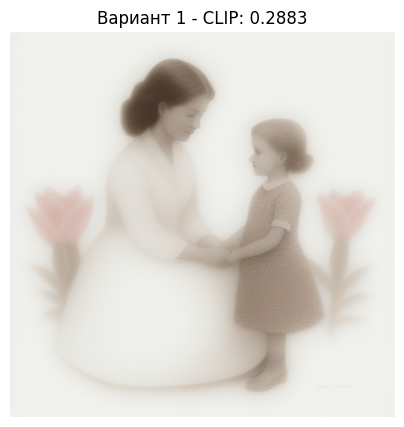

  0%|          | 0/50 [00:00<?, ?it/s]

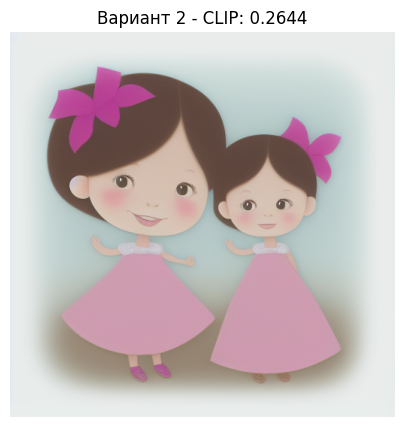

  0%|          | 0/50 [00:00<?, ?it/s]

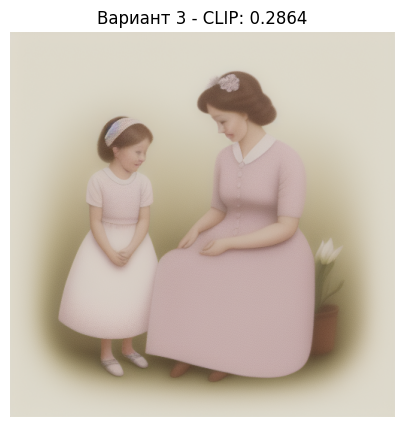

Лучший CLIP Score: 0.2883 (вариант 1)


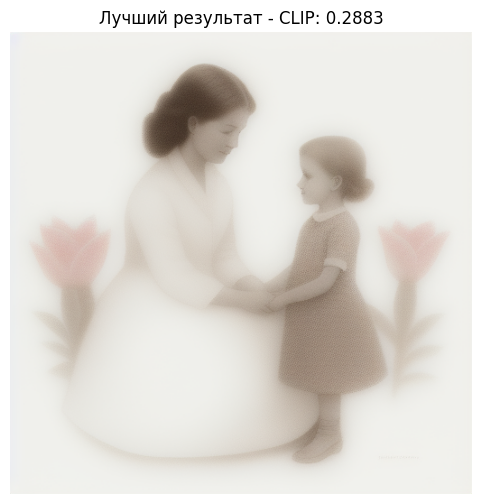

  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'Lily's bedroom, Lily's mother's house': качество 0.3890 < 0.5 (попытка 1)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'Lily's bedroom, Lily's mother's house': качество 0.4071 < 0.5 (попытка 2)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'Lily's bedroom, Lily's mother's house': качество 0.2777 < 0.5 (попытка 3)
⚠ Для локации 'Lily's bedroom, Lily's mother's house' достигнут максимум попыток. Лучшее качество: 0.2777


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'Lily's bedroom': качество 0.3966 < 0.5 (попытка 1)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'Lily's bedroom': качество 0.3543 < 0.5 (попытка 2)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'Lily's bedroom': качество 0.4396 < 0.5 (попытка 3)
⚠ Для локации 'Lily's bedroom' достигнут максимум попыток. Лучшее качество: 0.4396
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


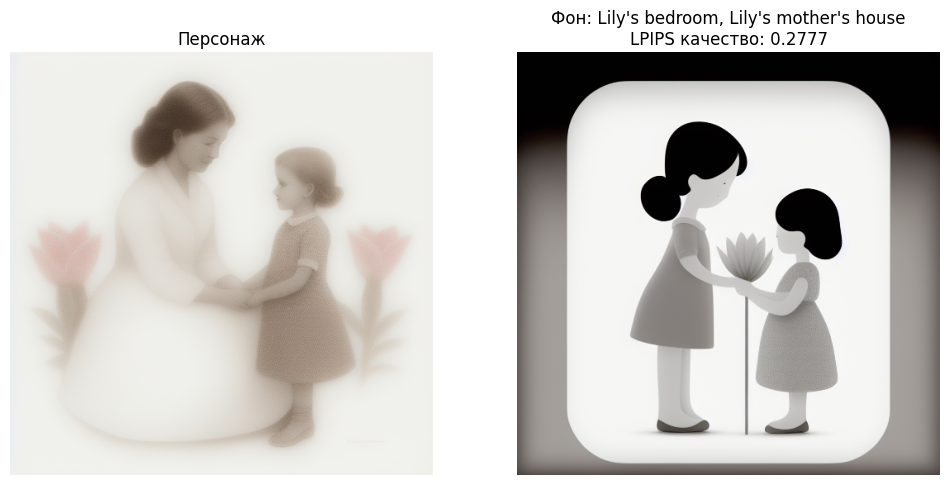

  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 1:
  CLIP: 0.2281 | LPIPS: 0.3723
  Текст: Lily finds a needle in her room....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2517 | LPIPS: 0.3475
  Текст: Lily shares the needle with her mom to sew a butto...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2583 | LPIPS: 0.2865
  Текст: Lily and her mom work together to fix Lily's shirt...


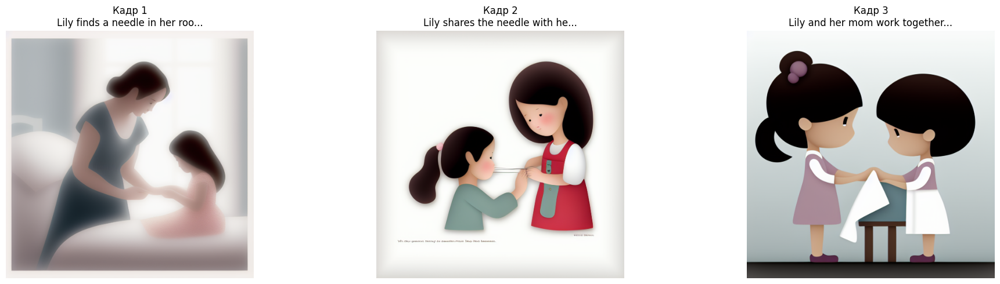

 10%|█         | 1/10 [05:33<49:57, 333.05s/it]

Сохранено: output_images/frame_0_1.jpg
Сохранено: output_images/frame_0_2.jpg
Сохранено: output_images/frame_0_3.jpg


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

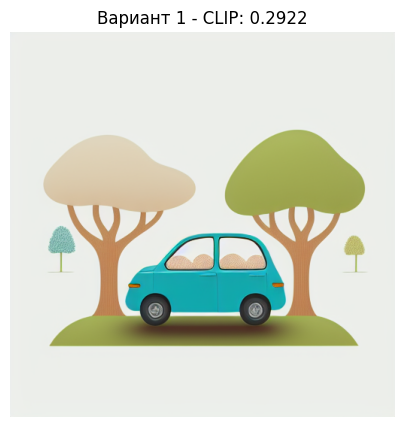

  0%|          | 0/50 [00:00<?, ?it/s]

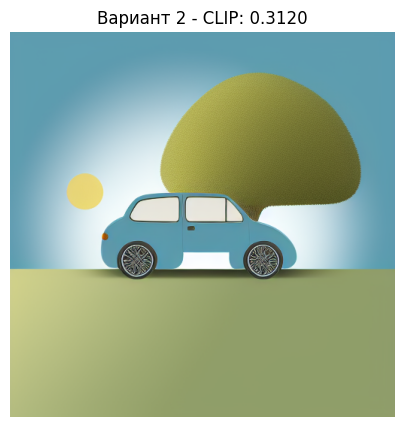

  0%|          | 0/50 [00:00<?, ?it/s]

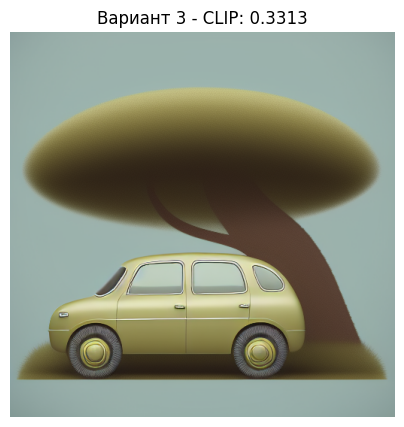

Лучший CLIP Score: 0.3313 (вариант 3)


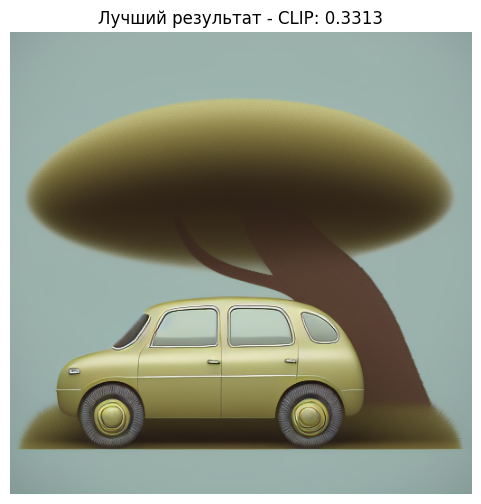

  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'A park with lush green grass, colorful flowers, and a sparkling lake surrounded by benches and picnic tables. The air is filled with the chirping of birds and the gentle rustling of leaves.': качество 0.3018 < 0.5 (попытка 1)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'A park with lush green grass, colorful flowers, and a sparkling lake surrounded by benches and picnic tables. The air is filled with the chirping of birds and the gentle rustling of leaves.': качество 0.3863 < 0.5 (попытка 2)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


Token indices sequence length is longer than the specified maximum sequence length for this model (82 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['of the foliage that carpet']


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'A park with lush green grass, colorful flowers, and a sparkling lake surrounded by benches and picnic tables. The air is filled with the chirping of birds and the gentle rustling of leaves.': качество 0.3536 < 0.5 (попытка 3)
⚠ Для локации 'A park with lush green grass, colorful flowers, and a sparkling lake surrounded by benches and picnic tables. The air is filled with the chirping of birds and the gentle rustling of leaves.' достигнут максимум попыток. Лучшее качество: 0.3536


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['of the foliage that carpet']


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'A park with a vast expanse of greenery and an abundance of fallen leaves served as the perfect setting for Beep to enjoy his daily ritual of watching the leaves dance gracefully beneath his feet. The crisp autumn air filled with the earthy scent of decay mingled harmoniously with the vibrant hues of the foliage that carpet': качество 0.3511 < 0.5 (попытка 1)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['of the foliage that carpet']


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'A park with a vast expanse of greenery and an abundance of fallen leaves served as the perfect setting for Beep to enjoy his daily ritual of watching the leaves dance gracefully beneath his feet. The crisp autumn air filled with the earthy scent of decay mingled harmoniously with the vibrant hues of the foliage that carpet': качество 0.2762 < 0.5 (попытка 2)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'A park with a vast expanse of greenery and an abundance of fallen leaves served as the perfect setting for Beep to enjoy his daily ritual of watching the leaves dance gracefully beneath his feet. The crisp autumn air filled with the earthy scent of decay mingled harmoniously with the vibrant hues of the foliage that carpet': качество 0.3802 < 0.5 (попытка 3)
⚠ Для локации 'A park with a vast expanse of greenery and an abundance of fallen leaves served as the perfect setting for Beep to enjoy his daily ritual of watching the leaves dance gracefully beneath his feet. The crisp autumn air filled with the earthy scent of decay mingled harmoniously with the vibrant hues of the foliage that carpet' достигнут максимум попыток. Лучшее качество: 0.3802


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'Fuel Station': качество 0.3648 < 0.5 (попытка 1)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'Fuel Station': качество 0.3443 < 0.5 (попытка 2)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'Fuel Station': качество 0.3620 < 0.5 (попытка 3)
⚠ Для локации 'Fuel Station' достигнут максимум попыток. Лучшее качество: 0.3620
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


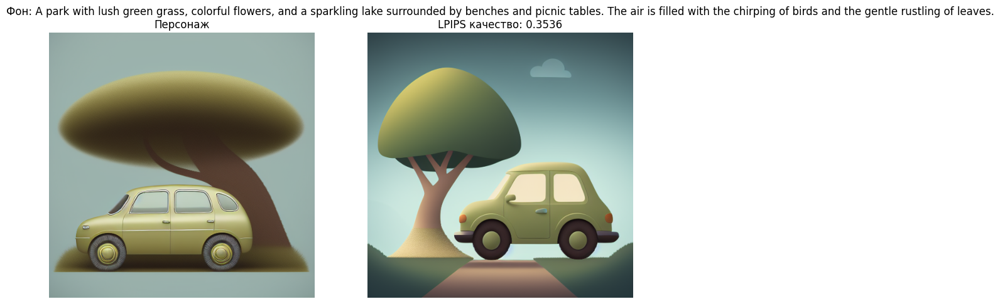

  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 1:
  CLIP: 0.2094 | LPIPS: 0.3425
  Текст: Beep started by loving to go fast and play in the ...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2201 | LPIPS: 0.4110
  Текст: One day, Beep enjoyed watching the leaves fall as ...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2448 | LPIPS: 0.3440
  Текст: After playing for a while, Beep realized he needed...


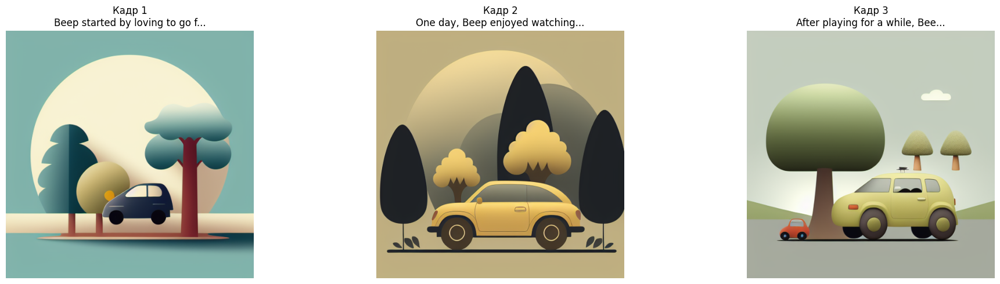

 20%|██        | 2/10 [11:52<48:04, 360.60s/it]

Сохранено: output_images/frame_1_1.jpg
Сохранено: output_images/frame_1_2.jpg
Сохранено: output_images/frame_1_3.jpg


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

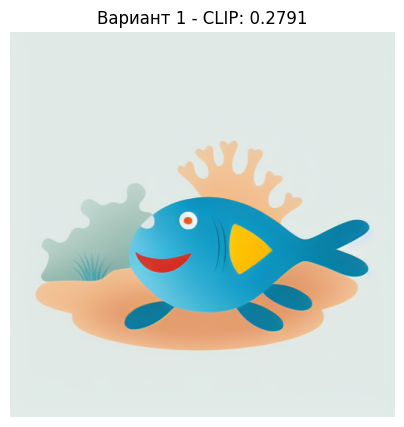

  0%|          | 0/50 [00:00<?, ?it/s]

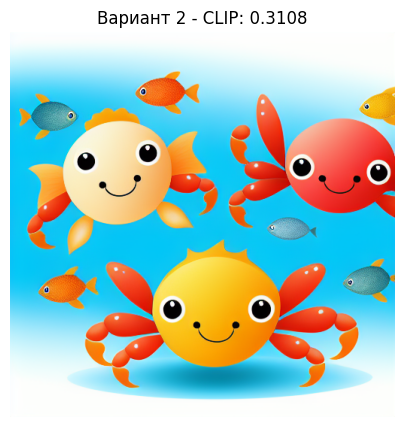

  0%|          | 0/50 [00:00<?, ?it/s]

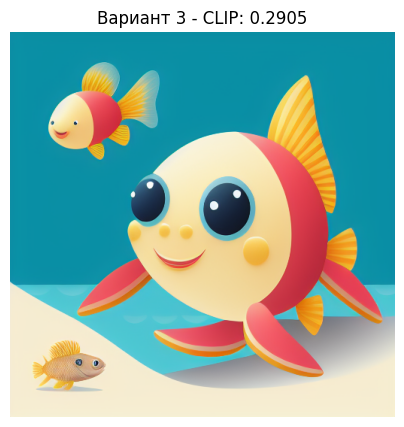

Лучший CLIP Score: 0.3108 (вариант 2)


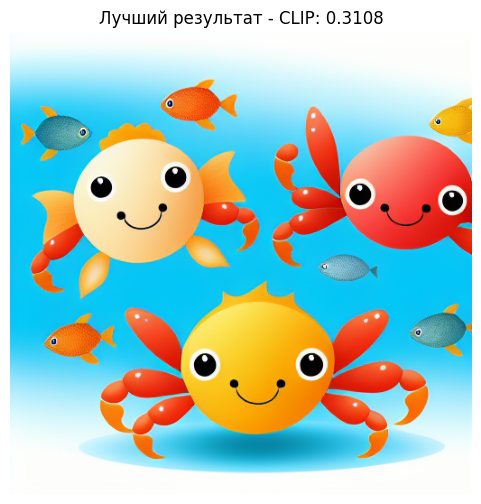

Token indices sequence length is longer than the specified maximum sequence length for this model (96 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['crab scuttled along the shoreline , its pincers moving quickly as it searched for food .']


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['crab scuttled along the shoreline , its pincers moving quickly as it searched for food .']


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'The shore was a bustling scene with waves crashing against rocks and seagulls crying overhead. The sun cast long shadows across the sandy beach, reflecting off the shimmering waters of the ocean. In the distance, a large crab scuttled along the shoreline, its pincers moving quickly as it searched for food.

': качество 0.2799 < 0.5 (попытка 1)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['crab scuttled along the shoreline , its pincers moving quickly as it searched for food .']


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'The shore was a bustling scene with waves crashing against rocks and seagulls crying overhead. The sun cast long shadows across the sandy beach, reflecting off the shimmering waters of the ocean. In the distance, a large crab scuttled along the shoreline, its pincers moving quickly as it searched for food.

': качество 0.2401 < 0.5 (попытка 2)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'The shore was a bustling scene with waves crashing against rocks and seagulls crying overhead. The sun cast long shadows across the sandy beach, reflecting off the shimmering waters of the ocean. In the distance, a large crab scuttled along the shoreline, its pincers moving quickly as it searched for food.

': качество 0.2539 < 0.5 (попытка 3)
⚠ Для локации 'The shore was a bustling scene with waves crashing against rocks and seagulls crying overhead. The sun cast long shadows across the sandy beach, reflecting off the shimmering waters of the ocean. In the distance, a large crab scuttled along the shoreline, its pincers moving quickly as it searched for food.

' достигнут максимум попыток. Лучшее качество: 0.2539


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'shore': качество 0.2231 < 0.5 (попытка 1)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'shore': качество 0.2782 < 0.5 (попытка 2)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['lapped against the soft sand . the air was filled with the salty scent of the sea , ming']


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'shore': качество 0.3276 < 0.5 (попытка 3)
⚠ Для локации 'shore' достигнут максимум попыток. Лучшее качество: 0.3276


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['lapped against the soft sand . the air was filled with the salty scent of the sea , ming']


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация '**Top of the Water**

The sun was just beginning to dip below the horizon, casting a warm glow over the vast expanse of ocean. The shore stretched out before Fin, its sandy beach lined with waves that gently lapped against the soft sand. The air was filled with the salty scent of the sea, ming': качество 0.2651 < 0.5 (попытка 1)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['lapped against the soft sand . the air was filled with the salty scent of the sea , ming']


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация '**Top of the Water**

The sun was just beginning to dip below the horizon, casting a warm glow over the vast expanse of ocean. The shore stretched out before Fin, its sandy beach lined with waves that gently lapped against the soft sand. The air was filled with the salty scent of the sea, ming': качество 0.2900 < 0.5 (попытка 2)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация '**Top of the Water**

The sun was just beginning to dip below the horizon, casting a warm glow over the vast expanse of ocean. The shore stretched out before Fin, its sandy beach lined with waves that gently lapped against the soft sand. The air was filled with the salty scent of the sea, ming': качество 0.2723 < 0.5 (попытка 3)
⚠ Для локации '**Top of the Water**

The sun was just beginning to dip below the horizon, casting a warm glow over the vast expanse of ocean. The shore stretched out before Fin, its sandy beach lined with waves that gently lapped against the soft sand. The air was filled with the salty scent of the sea, ming' достигнут максимум попыток. Лучшее качество: 0.2723
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpi

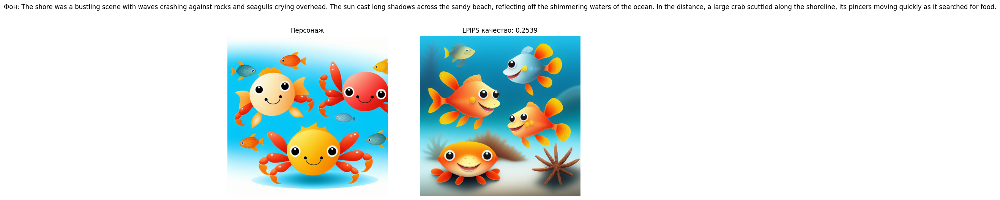

  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 1:
  CLIP: 0.2739 | LPIPS: 0.2957
  Текст: The little fish named Fin saw a big crab and wante...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2634 | LPIPS: 0.3164
  Текст: The crab did not want to play and felt cold and un...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2505 | LPIPS: 0.2944
  Текст: Fin swam away and came up with a plan to help the ...


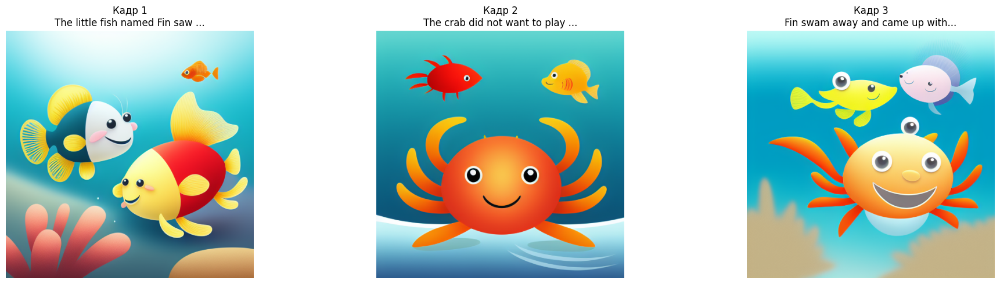

 30%|███       | 3/10 [18:11<43:01, 368.74s/it]

Сохранено: output_images/frame_2_1.jpg
Сохранено: output_images/frame_2_2.jpg
Сохранено: output_images/frame_2_3.jpg


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

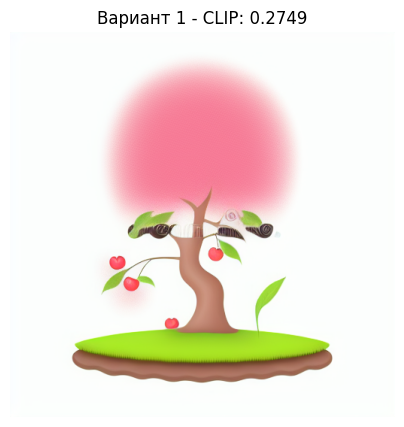

  0%|          | 0/50 [00:00<?, ?it/s]

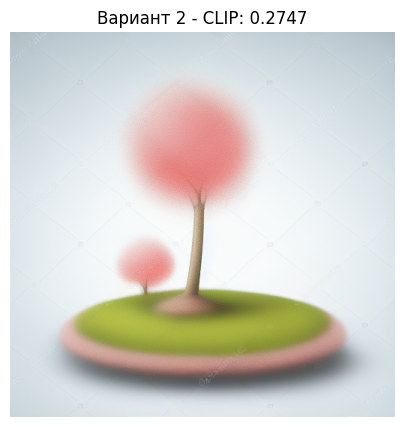

  0%|          | 0/50 [00:00<?, ?it/s]

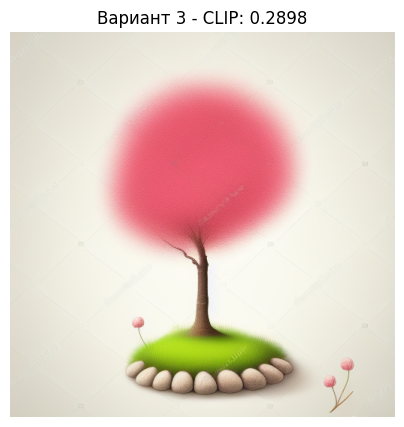

Лучший CLIP Score: 0.2898 (вариант 3)


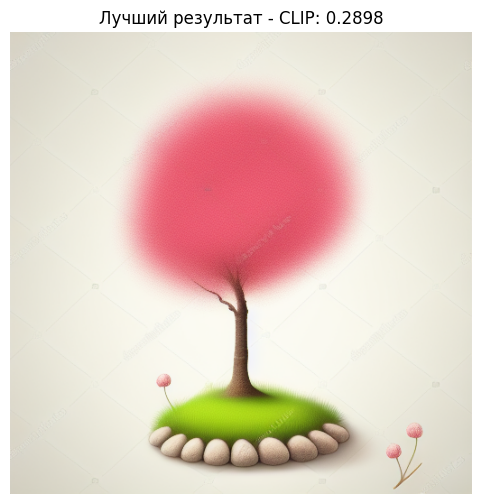

  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'countryside': качество 0.4126 < 0.5 (попытка 1)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'countryside': качество 0.4414 < 0.5 (попытка 2)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'countryside': качество 0.3413 < 0.5 (попытка 3)
⚠ Для локации 'countryside' достигнут максимум попыток. Лучшее качество: 0.3413


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'orchard': качество 0.3513 < 0.5 (попытка 1)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'orchard': качество 0.4341 < 0.5 (попытка 2)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
✓ Локация 'orchard': качество 0.6880 (попытка 3)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
✓ Локация '**Orchard**': качество 0.6349 (попытка 1)
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


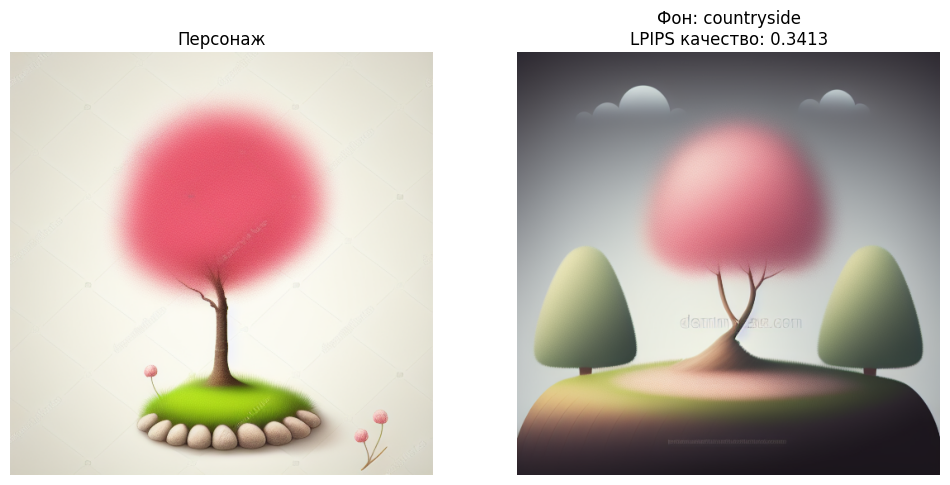

  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 1:
  CLIP: 0.2937 | LPIPS: 0.5831
  Текст: The cherry tree experienced sadness due to lack of...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2542 | LPIPS: 0.4119
  Текст: A spring breeze provided comfort by reminding the ...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.3049 | LPIPS: 0.4167
  Текст: With growing cherries, the cherry tree gained nume...


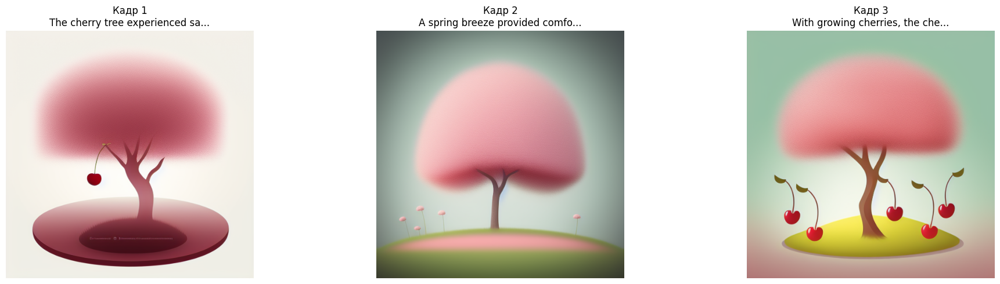

 40%|████      | 4/10 [23:59<36:02, 360.45s/it]

Сохранено: output_images/frame_3_1.jpg
Сохранено: output_images/frame_3_2.jpg
Сохранено: output_images/frame_3_3.jpg


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

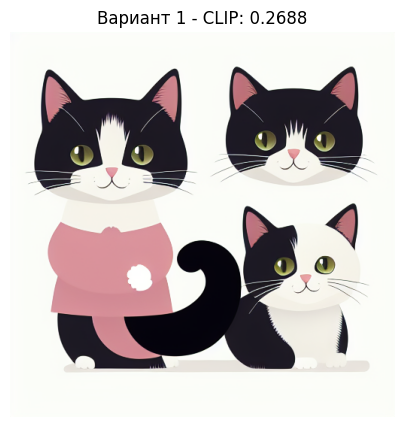

  0%|          | 0/50 [00:00<?, ?it/s]

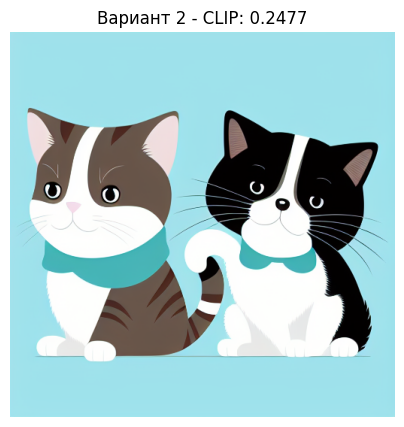

  0%|          | 0/50 [00:00<?, ?it/s]

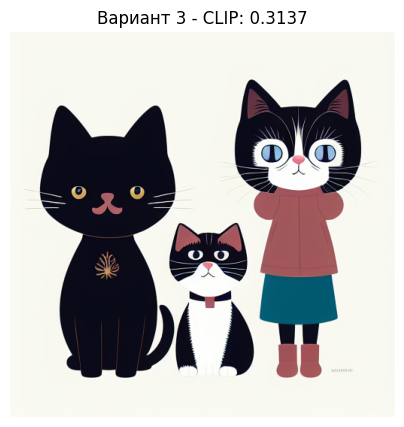

Лучший CLIP Score: 0.3137 (вариант 3)


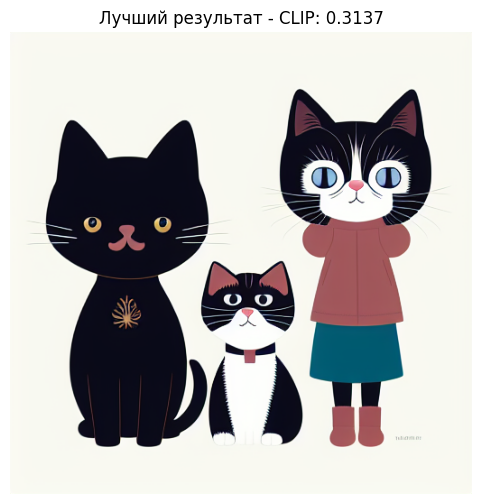

  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'kitchen': качество 0.3733 < 0.5 (попытка 1)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'kitchen': качество 0.2463 < 0.5 (попытка 2)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'kitchen': качество 0.2512 < 0.5 (попытка 3)
⚠ Для локации 'kitchen' достигнут максимум попыток. Лучшее качество: 0.2512


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'Garden': качество 0.3499 < 0.5 (попытка 1)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'Garden': качество 0.3053 < 0.5 (попытка 2)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'Garden': качество 0.3861 < 0.5 (попытка 3)
⚠ Для локации 'Garden' достигнут максимум попыток. Лучшее качество: 0.3861


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'garden': качество 0.3103 < 0.5 (попытка 1)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'garden': качество 0.4134 < 0.5 (попытка 2)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'garden': качество 0.3923 < 0.5 (попытка 3)
⚠ Для локации 'garden' достигнут максимум попыток. Лучшее качество: 0.3923
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


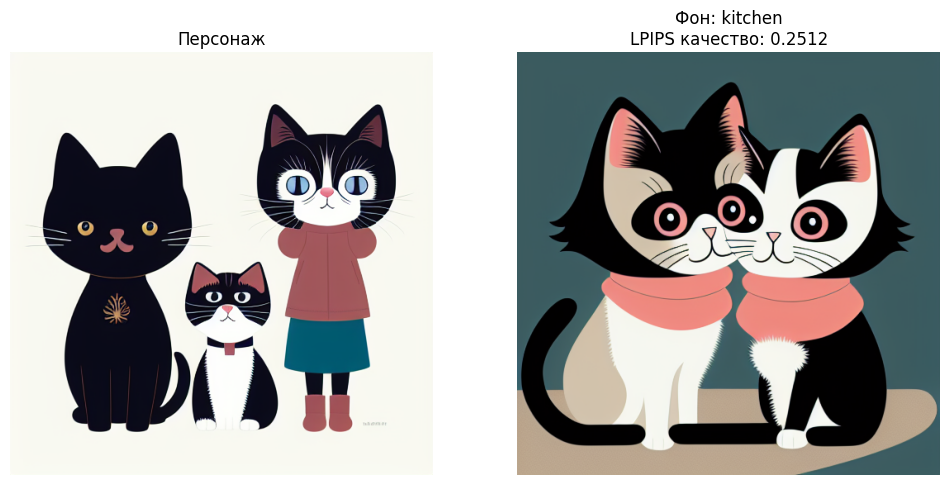

  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 1:
  CLIP: 0.1786 | LPIPS: 0.3651
  Текст: Lily finds a big cobweb in her castle playground....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2405 | LPIPS: 0.3414
  Текст: Lily is scared of the spider living in the cobweb....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2690 | LPIPS: 0.3638
  Текст: Lily asks her friends (cat and dog) for help to re...


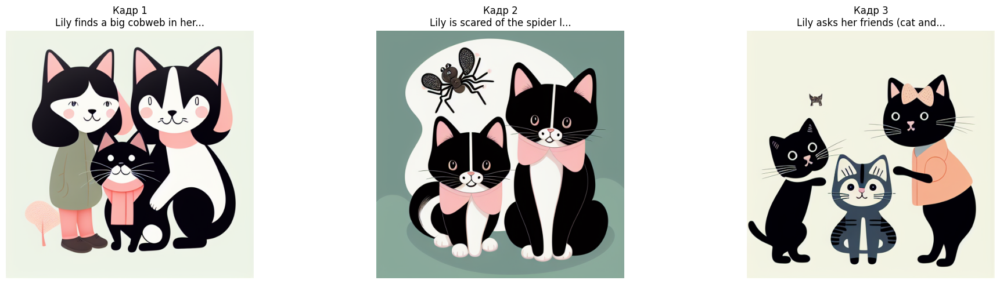

 50%|█████     | 5/10 [30:16<30:32, 366.46s/it]

Сохранено: output_images/frame_4_1.jpg
Сохранено: output_images/frame_4_2.jpg
Сохранено: output_images/frame_4_3.jpg


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

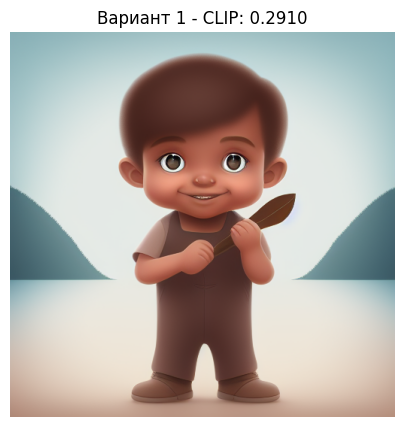

  0%|          | 0/50 [00:00<?, ?it/s]

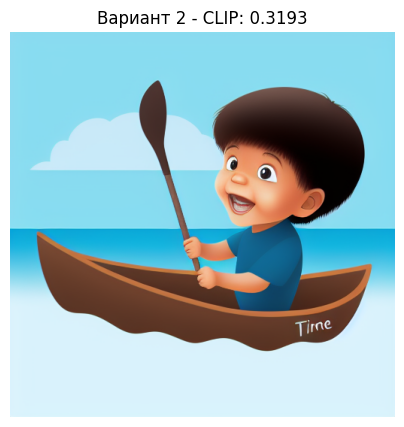

  0%|          | 0/50 [00:00<?, ?it/s]

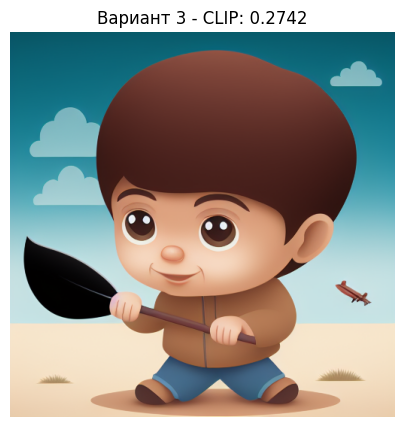

Лучший CLIP Score: 0.3193 (вариант 2)


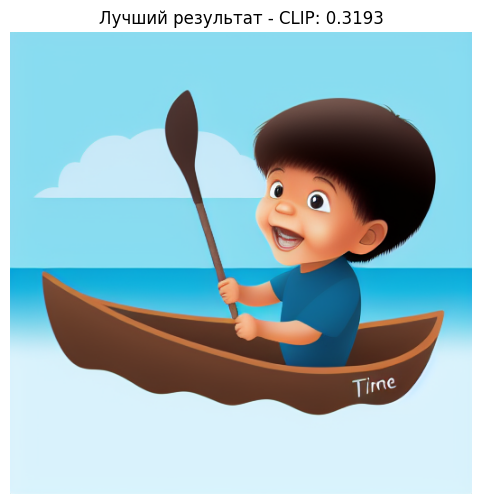

Token indices sequence length is longer than the specified maximum sequence length for this model (80 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['out like welcoming']


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['out like welcoming']


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'The setting of the story is nestled beside the vast expanse of a shimmering big lake. The sun casts long shadows across the water's surface, reflecting off the emerald green waves that stretch as far as the eye can see. Tall, dense trees line both banks of the lake, their branches reaching out like welcoming': качество 0.3367 < 0.5 (попытка 1)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['out like welcoming']


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'The setting of the story is nestled beside the vast expanse of a shimmering big lake. The sun casts long shadows across the water's surface, reflecting off the emerald green waves that stretch as far as the eye can see. Tall, dense trees line both banks of the lake, their branches reaching out like welcoming': качество 0.3431 < 0.5 (попытка 2)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'The setting of the story is nestled beside the vast expanse of a shimmering big lake. The sun casts long shadows across the water's surface, reflecting off the emerald green waves that stretch as far as the eye can see. Tall, dense trees line both banks of the lake, their branches reaching out like welcoming': качество 0.2882 < 0.5 (попытка 3)
⚠ Для локации 'The setting of the story is nestled beside the vast expanse of a shimmering big lake. The sun casts long shadows across the water's surface, reflecting off the emerald green waves that stretch as far as the eye can see. Tall, dense trees line both banks of the lake, their branches reaching out like welcoming' достигнут максимум попыток. Лучшее качество: 0.2882


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'Big Lake': качество 0.3698 < 0.5 (попытка 1)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'Big Lake': качество 0.3394 < 0.5 (попытка 2)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'Big Lake': качество 0.3064 < 0.5 (попытка 3)
⚠ Для локации 'Big Lake' достигнут максимум попыток. Лучшее качество: 0.3064


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'The big lake, beside the lake, where Tim's house is located.': качество 0.3790 < 0.5 (попытка 1)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'The big lake, beside the lake, where Tim's house is located.': качество 0.3376 < 0.5 (попытка 2)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'The big lake, beside the lake, where Tim's house is located.': качество 0.3324 < 0.5 (попытка 3)
⚠ Для локации 'The big lake, beside the lake, where Tim's house is located.' достигнут максимум попыток. Лучшее качество: 0.3324
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


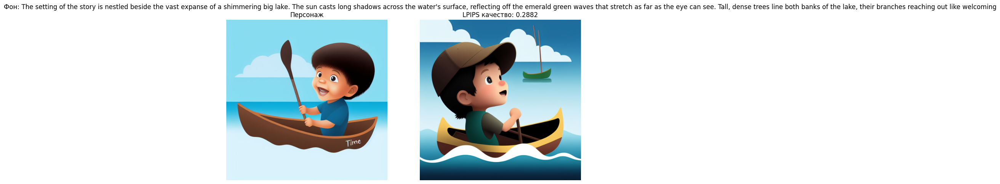

  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 1:
  CLIP: 0.2368 | LPIPS: 0.2568
  Текст: Describe the setting where the story takes place....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2581 | LPIPS: 0.3384
  Текст: Introduce the protagonist - a little boy named Tim...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2588 | LPIPS: 0.3343
  Текст: Show Tim's interaction with the brown kayak, inclu...


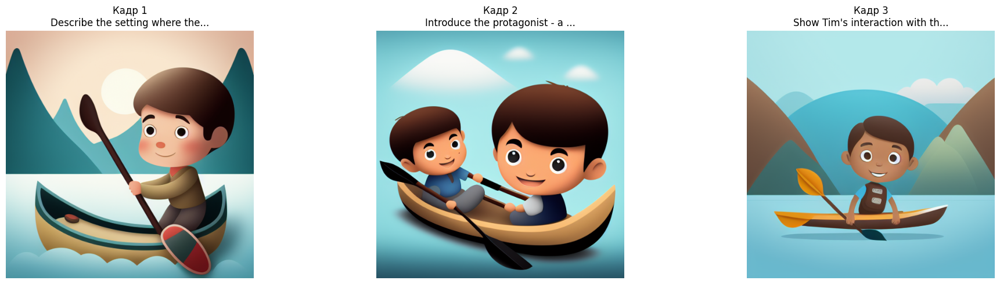

 60%|██████    | 6/10 [36:33<24:41, 370.26s/it]

Сохранено: output_images/frame_5_1.jpg
Сохранено: output_images/frame_5_2.jpg
Сохранено: output_images/frame_5_3.jpg


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

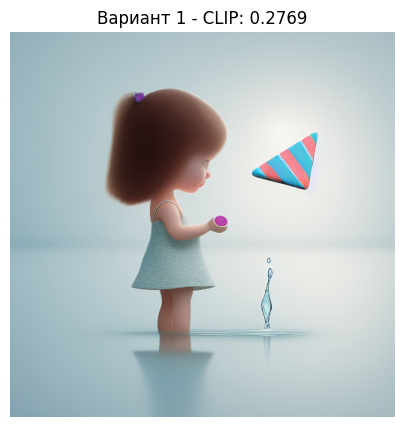

  0%|          | 0/50 [00:00<?, ?it/s]

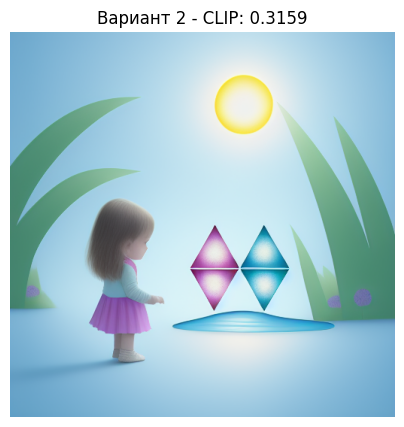

  0%|          | 0/50 [00:00<?, ?it/s]

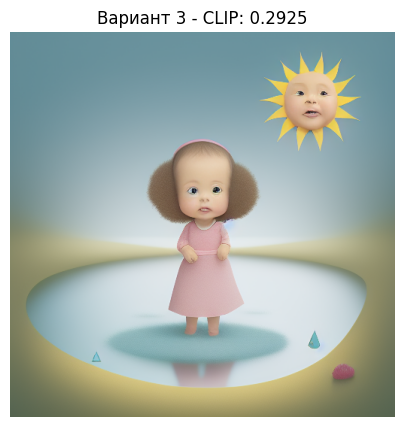

Лучший CLIP Score: 0.3159 (вариант 2)


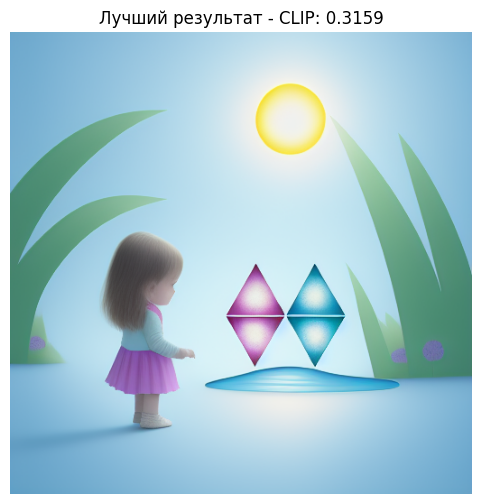

  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'house': качество 0.3111 < 0.5 (попытка 1)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'house': качество 0.2511 < 0.5 (попытка 2)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'house': качество 0.3534 < 0.5 (попытка 3)
⚠ Для локации 'house' достигнут максимум попыток. Лучшее качество: 0.3534


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'park': качество 0.3095 < 0.5 (попытка 1)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'park': качество 0.3632 < 0.5 (попытка 2)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'park': качество 0.3437 < 0.5 (попытка 3)
⚠ Для локации 'park' достигнут максимум попыток. Лучшее качество: 0.3437
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


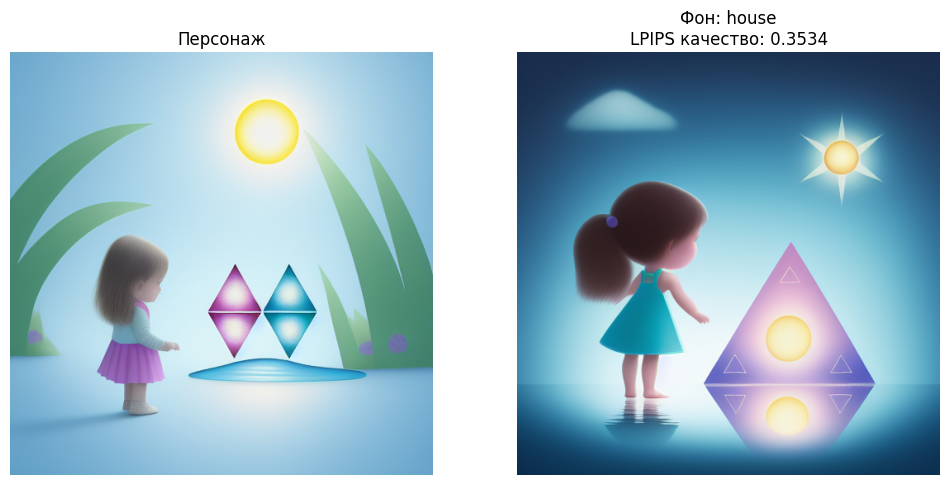

  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 1:
  CLIP: 0.2491 | LPIPS: 0.3149
  Текст: Lily searches for her missing triangle toy after l...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2920 | LPIPS: 0.3262
  Текст: Lily accidentally discovers her triangle by accide...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2817 | LPIPS: 0.3448
  Текст: Lily is relieved to find her triangle and resumes ...


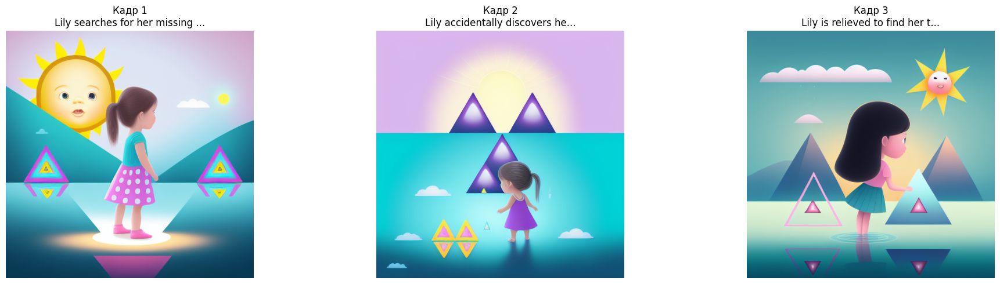

 70%|███████   | 7/10 [42:09<17:57, 359.06s/it]

Сохранено: output_images/frame_6_1.jpg
Сохранено: output_images/frame_6_2.jpg
Сохранено: output_images/frame_6_3.jpg


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

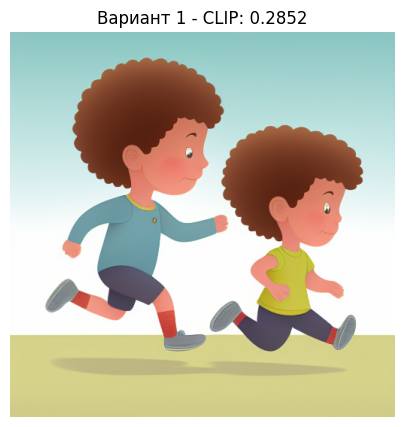

  0%|          | 0/50 [00:00<?, ?it/s]

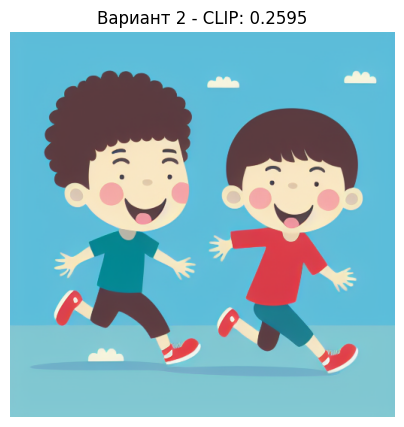

  0%|          | 0/50 [00:00<?, ?it/s]

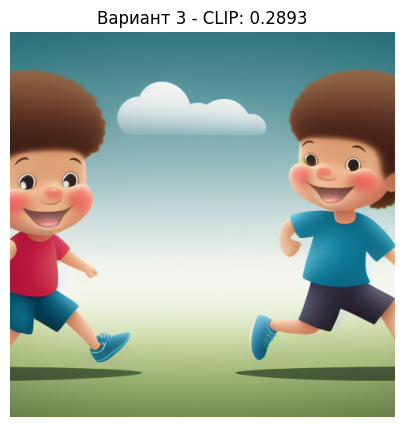

Лучший CLIP Score: 0.2893 (вариант 3)


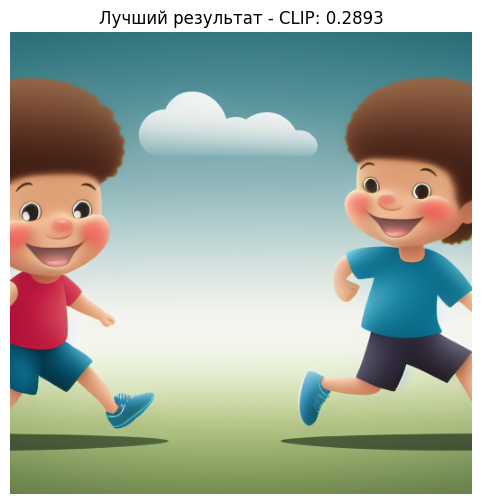

  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'neighborhood streets': качество 0.2618 < 0.5 (попытка 1)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'neighborhood streets': качество 0.2988 < 0.5 (попытка 2)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'neighborhood streets': качество 0.3011 < 0.5 (попытка 3)
⚠ Для локации 'neighborhood streets' достигнут максимум попыток. Лучшее качество: 0.3011


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'park': качество 0.2556 < 0.5 (попытка 1)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'park': качество 0.2775 < 0.5 (попытка 2)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'park': качество 0.2267 < 0.5 (попытка 3)
⚠ Для локации 'park' достигнут максимум попыток. Лучшее качество: 0.2267


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'City Center': качество 0.1820 < 0.5 (попытка 1)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'City Center': качество 0.2287 < 0.5 (попытка 2)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'City Center': качество 0.2758 < 0.5 (попытка 3)
⚠ Для локации 'City Center' достигнут максимум попыток. Лучшее качество: 0.2758
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


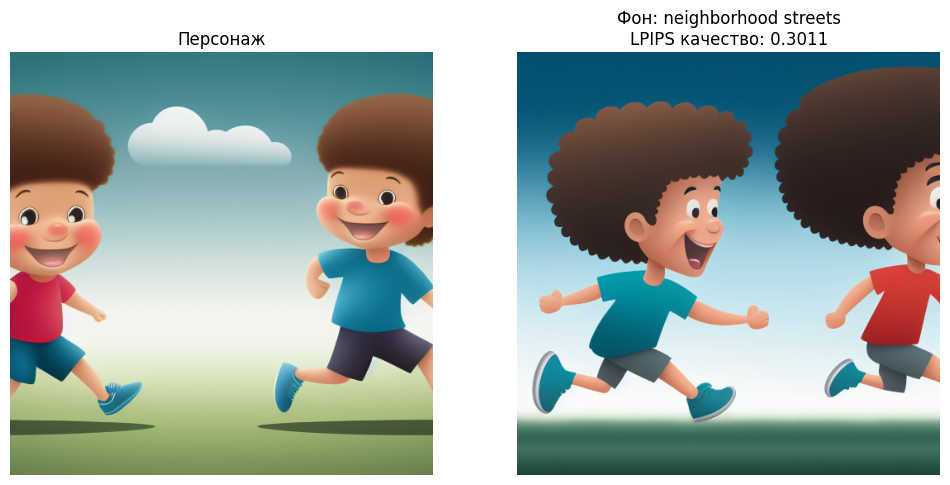

  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 1:
  CLIP: 0.2469 | LPIPS: 0.3031
  Текст: Tim goes to see a race in the park....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2280 | LPIPS: 0.3718
  Текст: Tim and Sarah participate in the race together....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.1923 | LPIPS: 0.2663
  Текст: The race ends with Tim winning and Sarah coming in...


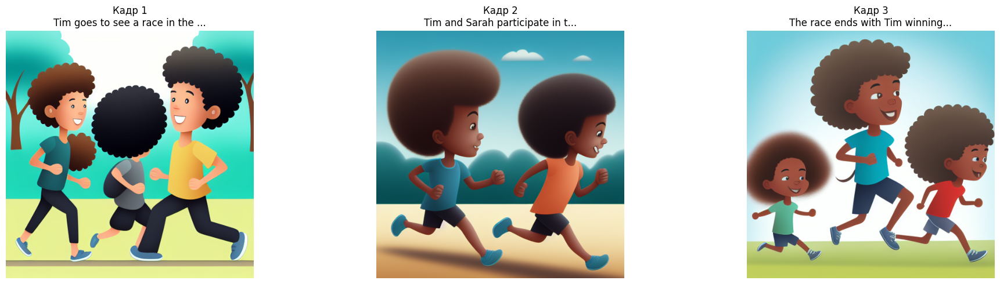

 80%|████████  | 8/10 [48:25<12:08, 364.41s/it]

Сохранено: output_images/frame_7_1.jpg
Сохранено: output_images/frame_7_2.jpg
Сохранено: output_images/frame_7_3.jpg


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

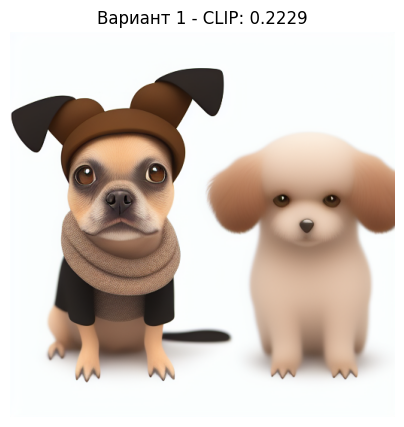

  0%|          | 0/50 [00:00<?, ?it/s]

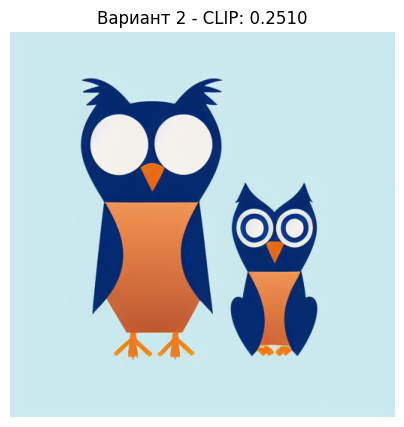

  0%|          | 0/50 [00:00<?, ?it/s]

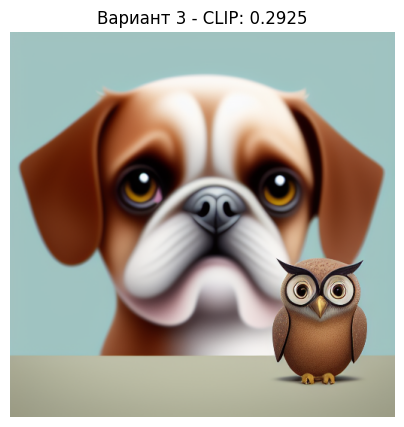

Лучший CLIP Score: 0.2925 (вариант 3)


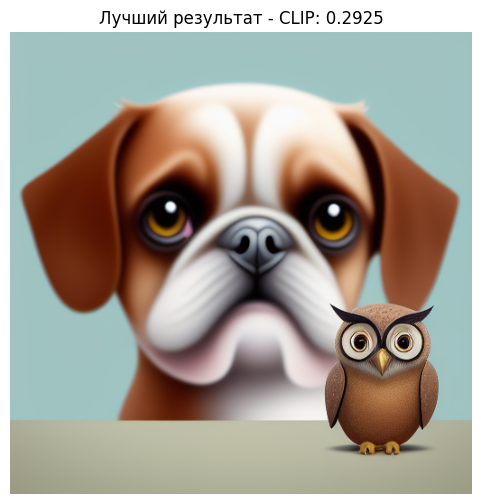

Token indices sequence length is longer than the specified maximum sequence length for this model (88 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['ping birds provide an ambient soundtrack as max approaches the towering']


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['ping birds provide an ambient soundtrack as max approaches the towering']


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'The wise old owl's nest is nestled high on a secluded hilltop overlooking the serene park below. The oak tree where Max often finds solace and inspiration stands sentinel over the winding paths that wind their way through the woods. The gentle rustling of leaves and chirping birds provide an ambient soundtrack as Max approaches the towering': качество 0.2404 < 0.5 (попытка 1)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['ping birds provide an ambient soundtrack as max approaches the towering']


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'The wise old owl's nest is nestled high on a secluded hilltop overlooking the serene park below. The oak tree where Max often finds solace and inspiration stands sentinel over the winding paths that wind their way through the woods. The gentle rustling of leaves and chirping birds provide an ambient soundtrack as Max approaches the towering': качество 0.2325 < 0.5 (попытка 2)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'The wise old owl's nest is nestled high on a secluded hilltop overlooking the serene park below. The oak tree where Max often finds solace and inspiration stands sentinel over the winding paths that wind their way through the woods. The gentle rustling of leaves and chirping birds provide an ambient soundtrack as Max approaches the towering': качество 0.2615 < 0.5 (попытка 3)
⚠ Для локации 'The wise old owl's nest is nestled high on a secluded hilltop overlooking the serene park below. The oak tree where Max often finds solace and inspiration stands sentinel over the winding paths that wind their way through the woods. The gentle rustling of leaves and chirping birds provide an ambient soundtrack as Max approaches the towering' достигнут максимум попыток. Лучшее качество: 0.2615


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'A small, secluded wooden bridge over a babbling brook.': качество 0.2407 < 0.5 (попытка 1)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'A small, secluded wooden bridge over a babbling brook.': качество 0.3114 < 0.5 (попытка 2)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'A small, secluded wooden bridge over a babbling brook.': качество 0.3067 < 0.5 (попытка 3)
⚠ Для локации 'A small, secluded wooden bridge over a babbling brook.' достигнут максимум попыток. Лучшее качество: 0.3067


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'park': качество 0.3460 < 0.5 (попытка 1)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'park': качество 0.3500 < 0.5 (попытка 2)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'park': качество 0.3651 < 0.5 (попытка 3)
⚠ Для локации 'park' достигнут максимум попыток. Лучшее качество: 0.3651
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


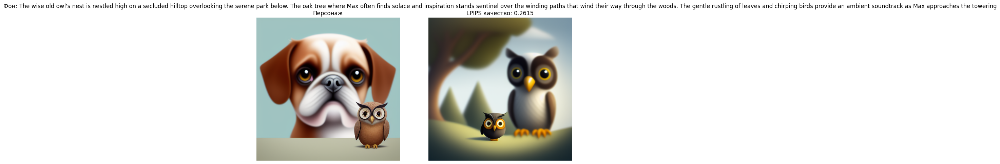

  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 1:
  CLIP: 0.1970 | LPIPS: 0.4094
  Текст: Max falls and hurts his knee while playing in the ...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.3347 | LPIPS: 0.3032
  Текст: Max goes to his friend, the wise old owl, who advi...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2104 | LPIPS: 0.3429
  Текст: Max tests his knee by walking slowly and finds out...


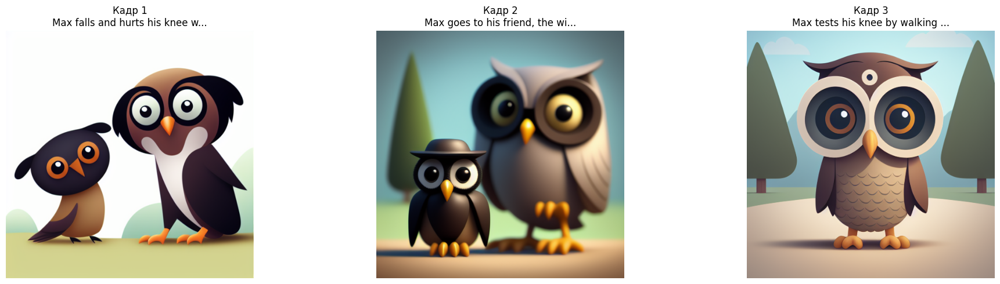

 90%|█████████ | 9/10 [54:46<06:09, 369.56s/it]

Сохранено: output_images/frame_8_1.jpg
Сохранено: output_images/frame_8_2.jpg
Сохранено: output_images/frame_8_3.jpg


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

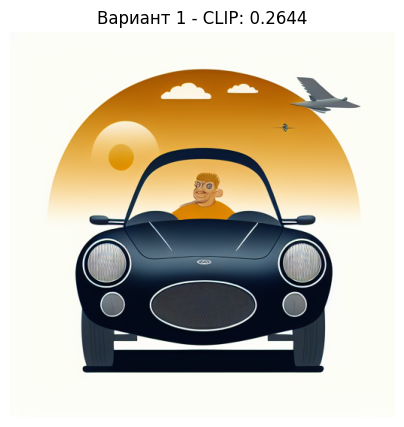

  0%|          | 0/50 [00:00<?, ?it/s]

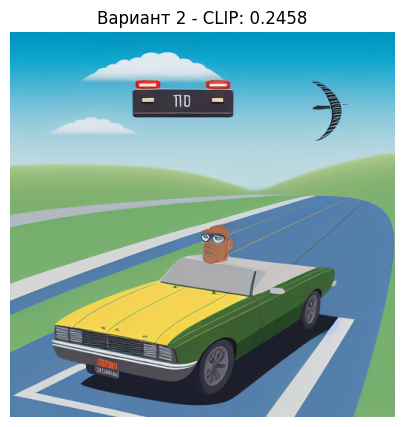

  0%|          | 0/50 [00:00<?, ?it/s]

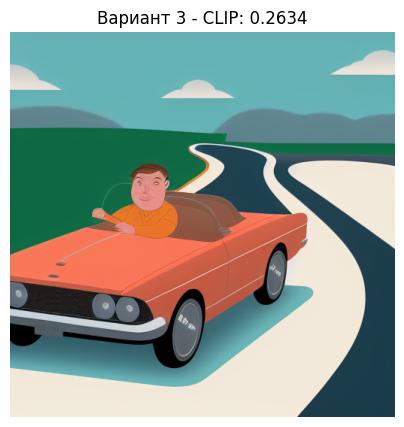

Лучший CLIP Score: 0.2644 (вариант 1)


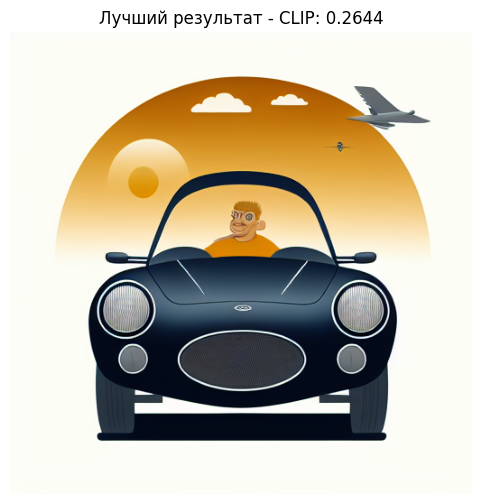

  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'The location where Tim can go for a ride in his loud car is **streets**.': качество 0.3715 < 0.5 (попытка 1)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'The location where Tim can go for a ride in his loud car is **streets**.': качество 0.3285 < 0.5 (попытка 2)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'The location where Tim can go for a ride in his loud car is **streets**.': качество 0.3267 < 0.5 (попытка 3)
⚠ Для локации 'The location where Tim can go for a ride in his loud car is **streets**.' достигнут максимум попыток. Лучшее качество: 0.3267


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'park': качество 0.2345 < 0.5 (попытка 1)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'park': качество 0.2429 < 0.5 (попытка 2)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


Token indices sequence length is longer than the specified maximum sequence length for this model (84 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['joy and laughter to their lives .']


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'park': качество 0.2302 < 0.5 (попытка 3)
⚠ Для локации 'park' достигнут максимум попыток. Лучшее качество: 0.2302


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['joy and laughter to their lives .']


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'The park was an ideal spot for them to unwind after their day of work. The lush greenery and open space provided ample opportunity for them to engage in various activities that brought joy and laughter to their lives.': качество 0.4103 < 0.5 (попытка 1)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['joy and laughter to their lives .']


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'The park was an ideal spot for them to unwind after their day of work. The lush greenery and open space provided ample opportunity for them to engage in various activities that brought joy and laughter to their lives.': качество 0.2813 < 0.5 (попытка 2)


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
× Локация 'The park was an ideal spot for them to unwind after their day of work. The lush greenery and open space provided ample opportunity for them to engage in various activities that brought joy and laughter to their lives.': качество 0.1688 < 0.5 (попытка 3)
⚠ Для локации 'The park was an ideal spot for them to unwind after their day of work. The lush greenery and open space provided ample opportunity for them to engage in various activities that brought joy and laughter to their lives.' достигнут максимум попыток. Лучшее качество: 0.1688
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


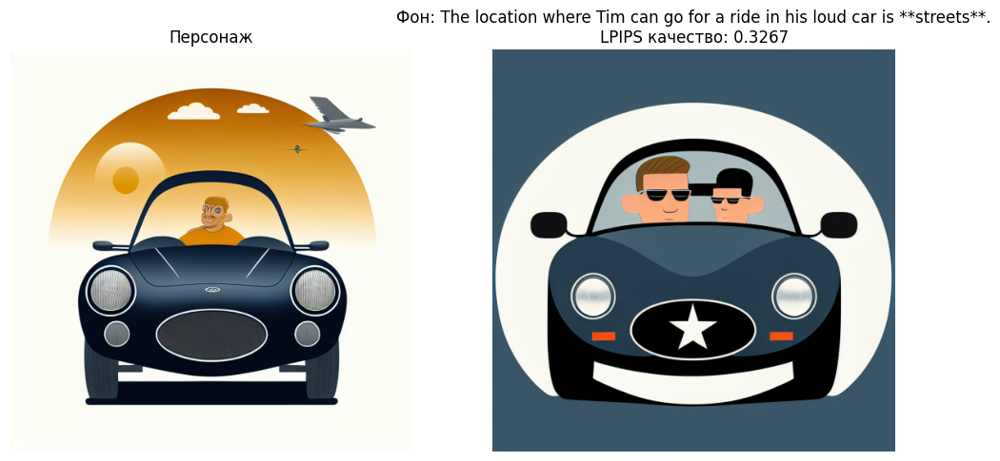

  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 1:
  CLIP: 0.2374 | LPIPS: 0.3088
  Текст: Tim goes for a ride in his loud car....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2203 | LPIPS: 0.2546
  Текст: Sam gets into the car and they drive around the to...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.1824 | LPIPS: 0.2121
  Текст: They stop at the park and have fun playing....


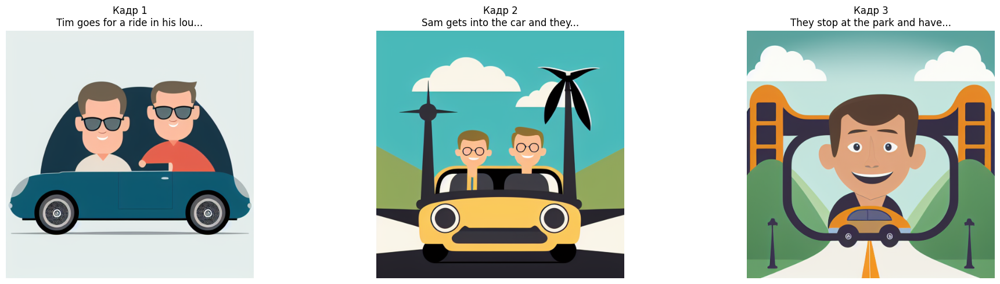

100%|██████████| 10/10 [1:01:03<00:00, 366.40s/it]

Сохранено: output_images/frame_9_1.jpg
Сохранено: output_images/frame_9_2.jpg
Сохранено: output_images/frame_9_3.jpg


In [32]:
clip_ls = []
lpip_ls = []
for i in tqdm(range(10)):
    
    best_frames, best_clips, best_lpips = gen_img(stories[i])
    
    save_images(best_frames, num_act=i)
    
    clip_ls.append(np.mean(best_clips))
    lpip_ls.append(np.mean(best_lpips))

In [ ]:
print(np.mean(clip_ls))
print(np.mean(lpip_ls))

0.2055729166666667
0.33933278918266296
